<a href="https://colab.research.google.com/github/Eugene31415/Data_science/blob/main/Gaussian_pyramid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Импортируем необходимые библиотеки

In [ ]:
from skimage.io import imread, imshow, imsave
from skimage import img_as_float, img_as_ubyte
from skimage.color import rgb2gray
from skimage.transform import pyramid_gaussian, pyramid_laplacian, resize
import matplotlib.pyplot as plt
import copy
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import convolve2d as conv
from scipy.fft import fft2, fftshift

#### Картинка для экспериментов

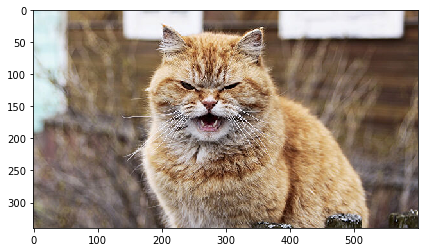

In [ ]:
img = img_as_float(imread('https://cdn24.img.ria.ru/images/151546/28/1515462835_0:0:1036:587_600x0_80_0_0_a75f922e8b052d966122e1c9dc40feb4.jpg'))
imshow(img)

### Часть (1):
#### Построим гауссовскую пирамиду изображения из не менее чем пяти слоев. Визуализируем полученные изображения и амплитуды частот изображений пирамиды и убедимся, что на каждом слое диапазон частот сужается. Построим пирамиду для трех различных значения сигмы гауссовского ядра. Для удобства экспериментирования определим отдельную функцию построения гауссовской пирамиды с параметрами img (изображение, по которому строится пирамида), sigma (параметр гауссовского ядра), n_layers (количество слоев пирамиды), возвращающую списки необходимых изображений.

#### Функция для отрисовки изображений

In [ ]:
def show(*args):
    sets = np.array([s for s in args])
    N = len(sets) # кол-во массивов с картинками
    min_size = min([sets[i].shape[0] for i in range(N)]) # мин кол-во картинок в массиве
    plt.figure(figsize=(50,10))
    for i in range(N):
        for j in range(min_size):
            plt.subplot(N, min_size, j + i*min_size + 1)
            plt.imshow(sets[i][j])

#### Кастомная функция для создания Гауссовской пирамиды

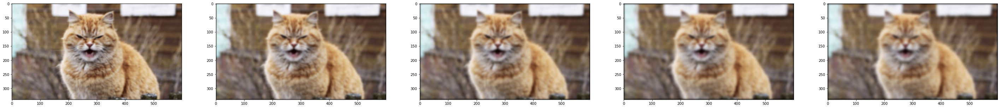

In [ ]:
def Gauss_piramid(img, sigma, n_layers):
    
    def create_gauss_mask(sigma): # Создаем Гауссовское ядро
        
        def Gauss(sigma, x ,y): # Функция возвращает значение двумерного гауссовского распределения в точке
            return 1 / (2 * np.pi * sigma**2) * np.exp((-x**2 - y**2) / (2 * sigma**2))
        
        k = round(sigma*3*2 + 1)
        mask = np.zeros((k,k))
        for channel in range(3):
            for i in range(-k//2,k//2+1):
                for j in range(-k//2,k//2+1):
                    mask[i+k//2,j+k//2] = Gauss(sigma,i,j) 
                
        mask /= sum(mask.ravel())
        
        return mask
    
    mask = create_gauss_mask(sigma)
    tmp = copy.deepcopy(img)
    arr = []
    for _ in range(n_layers):
        prev = np.zeros_like(img)
        # If the input img is rgb
        if len(img.shape) == 3:
            for i in range(3):
                prev[:,:,i] = conv(tmp[:,:,i], mask, mode='same')
        # if the input image is only one schannel
        else:
            prev = conv(tmp, mask, mode='same')
        arr.append(np.clip(prev,0,1))
        tmp = copy.deepcopy(prev)
    
    return arr

arr = Gauss_piramid(img, 1.7, 5)
show(arr)

#### Решил попробовать функцию гауссовской пирамиды из skimage, но тут есть несколько неприятных моментов.

Во-первых, функция не работает, как я понял, с 3х канальными изображениями. Ей нужно подавать по одному каналу. Ну ладно, это еще можно обойти. Основная проблема в том, что оно урезает размер изображения при создании очередного слой. Поэтому, собственно, и называется пирамидой, так как каждый последующий слой меньше по площади чем предыдущий. Так что будем использовать свою кастомную функию

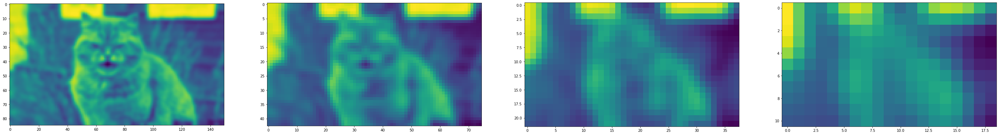

In [ ]:
arr2 = []
for i in pyramid_gaussian(img, max_layer=5, sigma=2, mode='reflect'):
    arr2.append(i)
# P.S. первое изображение - исходное, а второе с двумя каналами, хз как его отображать...
show(arr2[2:])

#### Сравнения с разными Sigma и визуальзация матриц амплитуд
Работать будем с одним каналом, например красным, чтобы легче было визуализировать матрицу амплитуд

In [ ]:
sigmas = [1,2,3]
n_layers = [5,10,15]
arr_sigma = np.array([Gauss_piramid(img, sigma, 5) for sigma in sigmas])
arr_layers = np.array([Gauss_piramid(img, 1, layers) for layers in n_layers])
amplitudes_sigma = np.array([[[np.log(1 + np.abs(fftshift(fft2(arr_sigma[k][j][:,:,i])))) for i in range(3)] for j in range(len(arr_sigma[k]))] for k in range(3)])
amplitudes_layer = np.array([[[np.log(1 + np.abs(fftshift(fft2(arr_layers[k][j][:,:,i])))) for i in range(3)] for j in range(len(arr_layers[k]))] for k in range(3)])

Сравнение при разных Sigma

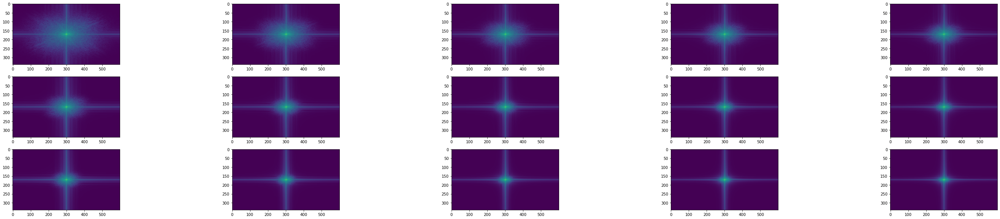

In [ ]:
show(amplitudes_sigma[0,:,0],amplitudes_sigma[1,:,0],amplitudes_sigma[2,:,0])

Сравнение при разных кол-вах слоев в пирамиде ( взяты последние 5 слоев везде )

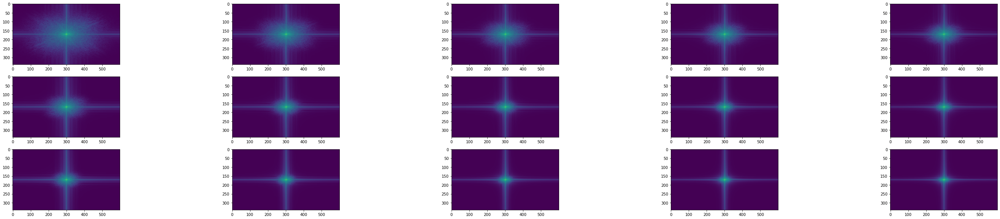

In [ ]:
show(amplitudes_sigma[0,-5:,0],amplitudes_sigma[1,-5:,0],amplitudes_sigma[2,-5:,0])

### Краткий вывод по первому пункту:
При увеличении сигма действительно, ровно как и при увеличении кол-ва слоев в пирамиде, действительно, более высокие частоты изображения убираются и остаютсяс лишь низкие. 

# Часть (2):
#### Проведем аналогичные эксперименты с лапласовской пирамидой. Функция для построения лапласовской пирамиды должна использовать функцию построения гауссовской пирамиды и иметь, как и функция гауссовской пирамиды, параметры img, sigma и n_layers.

даже с размытием слои гауссовской пирамиды очень похожи друг на друга, поэтому на разности почти ничего не видно

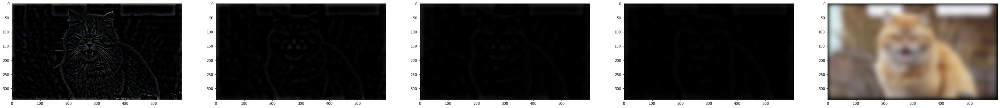

In [ ]:
def Laplass_piramid(img, sigma, n_layers):
    arr = [img]
    [arr.append(i) for i in Gauss_piramid(img, sigma, n_layers-1)]
#     arr = Gauss_piramid(img, sigma, n_layers-1)
#     imshow(arr[1] - arr[0])
    new_arr = [np.clip((arr[i] - arr[i+1]),0,1) for i in range(len(arr) - 1)]
    new_arr.append(arr[-1])
    return new_arr
arr = Laplass_piramid(img, 5, 5)
show(arr)

#### По традиции посмотрим на библиотечную реализацию функции Лаплассовской пирамиды

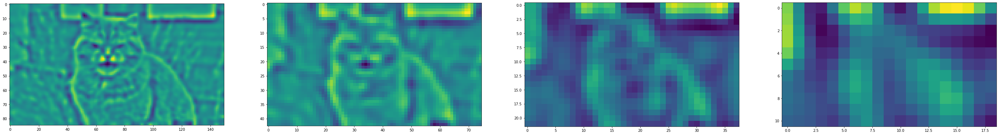

In [ ]:
arr2 = []
for i in pyramid_laplacian(img, max_layer=5, sigma=2, mode='reflect'):
    arr2.append(i)
# P.S. первое изображение - исходное, а второе с двумя каналами, хз как его отображать...
show(arr2[2:])

#### Сравнения с разными Sigma и визуальзация матриц амплитуд
Работать будем с одним каналом, например красным, чтобы легче было визуализировать матрицу амплитуд

In [ ]:
sigmas = [1,2,3]
n_layers = [5,10,15]
arr_sigma = np.array([Laplass_piramid(img, sigma, 5) for sigma in sigmas])
arr_layers = np.array([Laplass_piramid(img, 1, layers) for layers in n_layers])
amplitudes_sigma = np.array([[[np.log(1 + np.abs(fftshift(fft2(arr_sigma[k][j][:,:,i])))) for i in range(3)] for j in range(len(arr_sigma[k]))] for k in range(3)])
amplitudes_layer = np.array([[[np.log(1 + np.abs(fftshift(fft2(arr_layers[k][j][:,:,i])))) for i in range(3)] for j in range(len(arr_layers[k]))] for k in range(3)])

Сравнение при разных Sigma

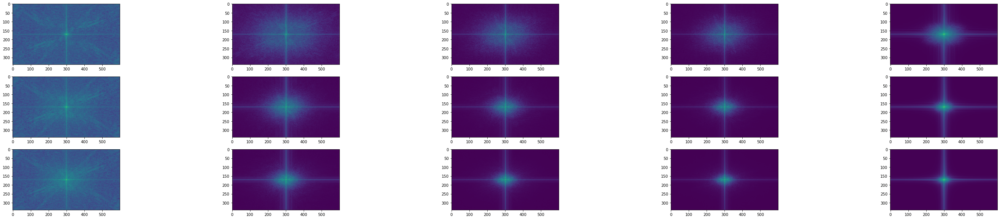

In [ ]:
show(amplitudes_sigma[0,:,0],amplitudes_sigma[1,:,0],amplitudes_sigma[2,:,0])

Сравнение при разных кол-вах слоев в пирамиде ( взяты последние 5 слоев везде )

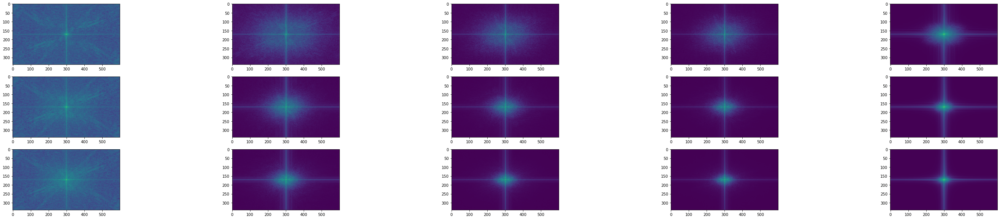

In [ ]:
show(amplitudes_sigma[0,-5:,0],amplitudes_sigma[1,-5:,0],amplitudes_sigma[2,-5:,0])

### Краткий вывод по первому пункту:
Если присмотреться, то можно заметить легкое кольцо полос, которые проявились в слоях лаппласовской пирамиды, но если честно, то видно очень слабо. Sigma и кол-во слоев также делают свою работу на отлично, убирая высокие частоты

# Часть (3):
#### На основе функций построения гауссовской и лапласовской пирамиды напишем функцию склейки двух изображений на основе маски. Функция должна возвращать склееные изображения и промежуточные результаты — склееные изображения разных частот (т.е. лапласовскую пирамиду совмещенного изображения). Изображения для тестирования: a.png, b.png, mask.png. Изображение с маской не является бинарным (т.е. имеет промежуточные градации серого), его можно бинаризовать путём сравнения всех элементов с порогом 128:

### mask = imread('mask.png')
#### mask = (mask > 128).astype('uint')
 
#### Посмотрим, как ведет себя склейка при изменении sigma (попробуем три варианта значений при фиксированном количестве слоев в пирамидах) и при изменении количества слоев (попробуем три варианта слоев при фиксированном sigma). Склейка должна выдавать качественный результат без видимых артефактов хотя бы с одним набором параметров.

Информация о тестовых изображениях + бинаризация маски

img1:  (249, 257, 3) 
img2:  (249, 257, 3) 
mask:  (249, 257, 3)


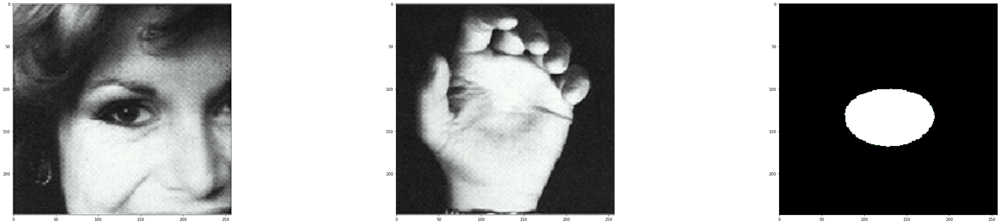

In [ ]:
img1 = img_as_float(imread('C://Users//Xiaomi//Downloads//a (1).png'))
img2 = img_as_float(imread('C://Users//Xiaomi//Downloads//b (1).png'))
mask = img_as_float(imread('C://Users//Xiaomi//Downloads//mask (1).png'))

mask[mask >= 0.5] = 1
mask[mask < 0.5] = 0

show([img1, img2, mask])
print('img1: ', img1.shape,'\nimg2: ', img2.shape,'\nmask: ', mask.shape)

In [ ]:
def glue(img1, img2, mask, sigma=1, n_layers=5):
    
    arr1 = Laplass_piramid(img1, sigma, n_layers)
    arr2 = Laplass_piramid(img2, sigma, n_layers)
    arr3 = Gauss_piramid(mask, sigma, n_layers)
    
    res_arr = [np.clip(arr3[i]*arr1[i] + (1 - arr3[i])*arr2[i], 0, 1) for i in range(n_layers)]
    return res_arr, sum(res_arr),arr3

Результат на тестовых картинках. Даже не смотря на то, что на слоях лаплассовской пирамиды почти ничего не видно, на финальной картинке получается качественное слияние

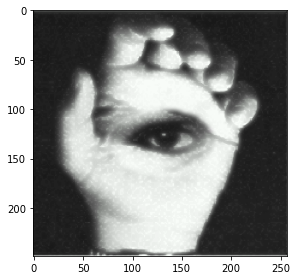

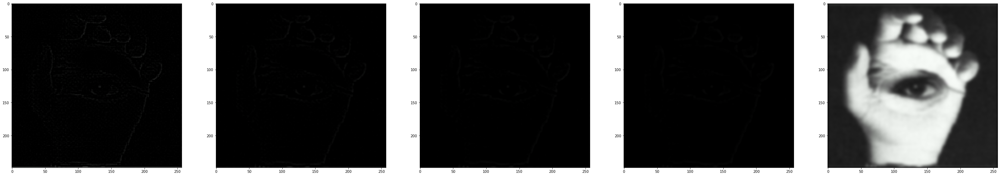

In [ ]:
arr = glue(img1, img2, mask, sigma=1, n_layers=5)[0]
ans = glue(img1, img2, mask, sigma=1, n_layers=5)[1]
imshow(ans)
show(arr)


In [ ]:
sigmas = [1,2,3]
n_layers = [5,10,15]
arr_sigma = np.array([glue(img1, img2, mask, sigma, n_layers=5) for sigma in sigmas])
arr_layers = np.array([glue(img1, img2, mask, sigma=1, n_layers=layers) for layers in n_layers])

На всех слоях кроме последнего в лаплассовской пирамиде почти ничего не видно, так что имеет смысл выводить только последний слой пирамиды и финальное, склеенное изображение

#### Разные sigma

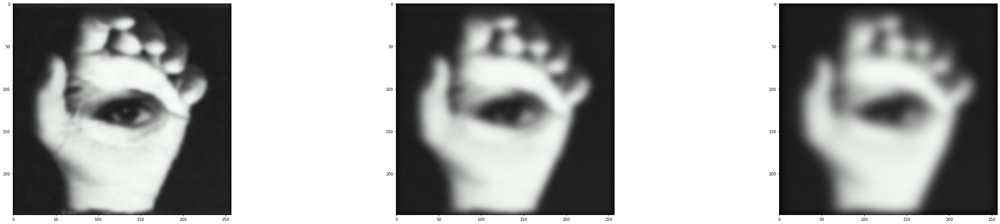

In [ ]:
show([arr_sigma[0][0][-1], arr_sigma[1][0][-1], arr_sigma[2][0][-1]])

Склеенные

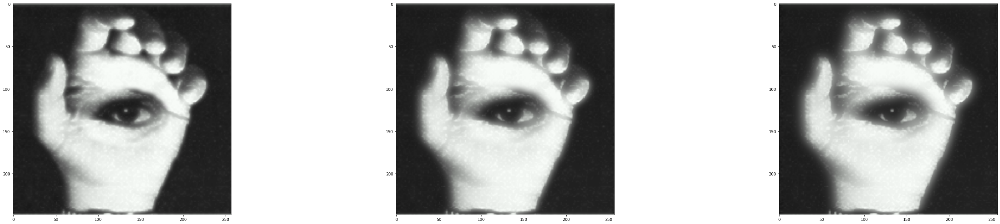

In [ ]:
show([arr_sigma[0][1],arr_sigma[1][1],arr_sigma[2][1]])

#### Разное кол-во слоев 

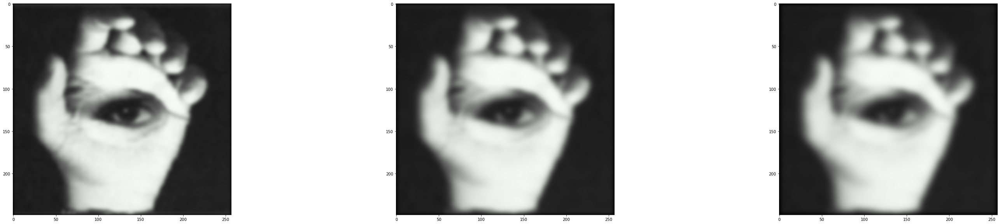

In [ ]:
show([arr_layers[0][0][-1], arr_layers[1][0][-1], arr_layers[2][0][-1]])

Склеенные

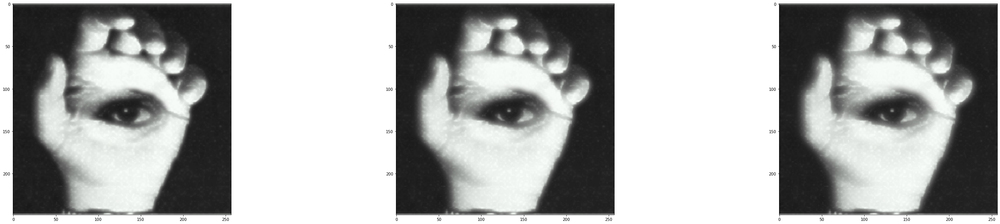

In [ ]:
show([arr_layers[0][1],arr_layers[1][1],arr_layers[2][1]])

# Часть (4):
#### Три набора изображений и масок для склейки

Подготовим картинки

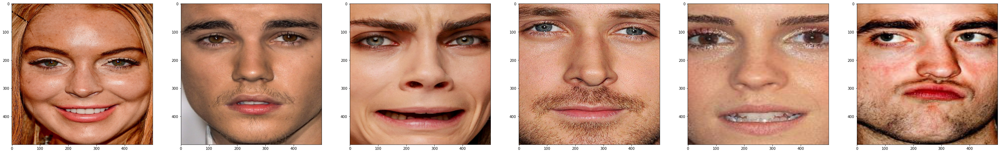

In [ ]:
n,m = 500, 500
img1 = resize(img_as_float(imread('http://vev.ru/uploads/images/00/01/64/2013/01/22/tumblr_m3vl3awb221qzy531o1_500.jpg')),(n,m))
img2 = resize(img_as_float(imread('https://kinoafisha.ua/upload/2014/06/news/42665/fotos/1403865459lica-zvezd-ocsen-krupnm-planom.jpg')),(n,m))
img3 = resize(img_as_float(imread('https://peopletalk.ru/wp-content/uploads/2016/08/model-Kara-Delevin-23.jpg')),(n,m))
img4 = resize(img_as_float(imread('http://www.peoples.ru/images/interesting/interesting_2012092601540415.jpg')),(n,m))
img5 = resize(img_as_float(imread('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRI1W_YG1rOYP12RZ_hdUqFOH0TV4AjUQbM_Q&usqp=CAU')),(n,m))
img6 = resize(img_as_float(imread('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTTVrhNPC1Eg5vMSf-gmSv5-gL_9eiuJ2eU9A&usqp=CAU')),(n,m))
show([img1, img2, img3, img4, img5, img6])

Подготовим маски

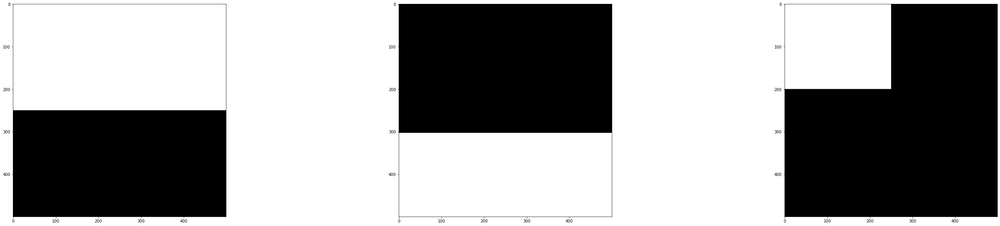

In [ ]:
mask1 = np.zeros_like(img1)
mask2 = np.ones_like(img1)
mask3 = np.zeros_like(img1)

mask1[:n//2,:] = 1
mask2[:2*n//3 - 30,:] = 0
mask3[:200,:250] = 1

show([mask1, mask2, mask3])

In [ ]:
res_1 = glue(img1, img2, mask1, sigma=3, n_layers=7)
res_2 = glue(img3, img4, mask2, sigma=3, n_layers=7)
res_3 = glue(img5, img6, mask3, sigma=3, n_layers=7)

#### Результаты для sigma = 1 и n_layers = 5 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


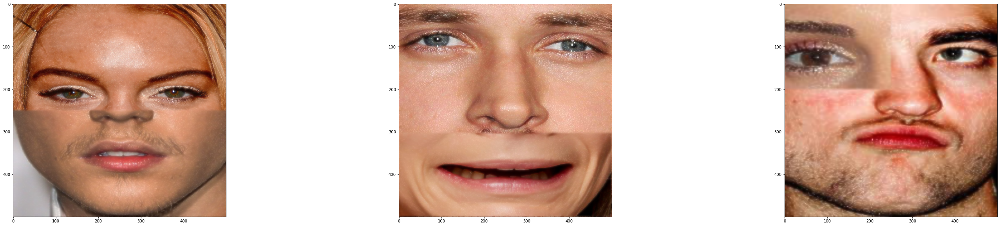

In [ ]:
show([res_1[1], res_2[1], res_3[1]])

#### Результаты для sigma = 3 и n_layers = 7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


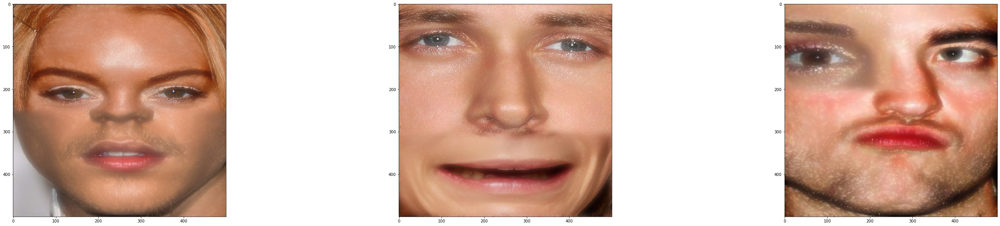

In [ ]:
show([res_1[1], res_2[1], res_3[1]])

# Вывод
Как выяснилось уже непосредственно на последнем этапе работы - sigma и n_layers отвечают за качество склейки. Выше приведены результаты для разных параметров. На руке с глазом такого отследить не удалось.